<a href="https://colab.research.google.com/github/MLDreamer/AIMathematicallyexplained/blob/main/MANIFOLD_HYPOTHESIS_VISUALIZATIONS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

MANIFOLD HYPOTHESIS VISUALIZATION GENERATOR
Creating 3 viral GIFs for your article...

🎬 Generating GIF 1: The Uncrumpling...
✅ Saved: manifold_uncrumpling.gif


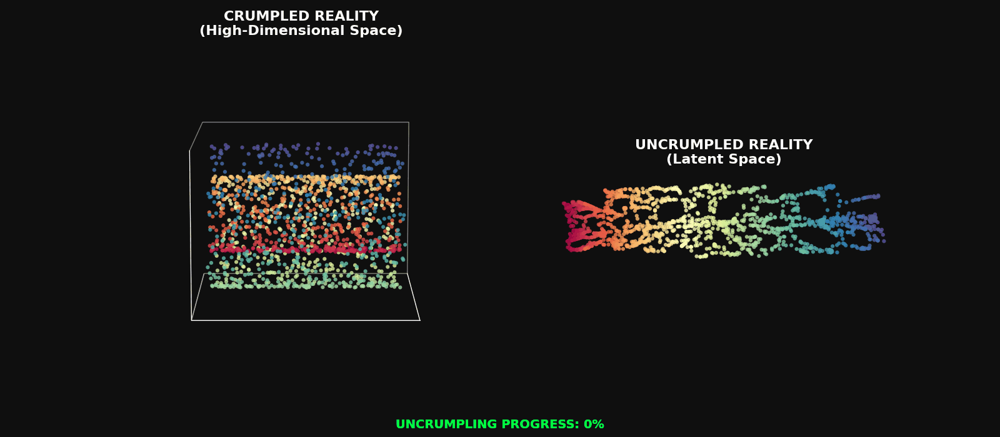


🎬 Generating GIF 2: The Paper Ball Analogy...
✅ Saved: paper_ball_analogy.gif


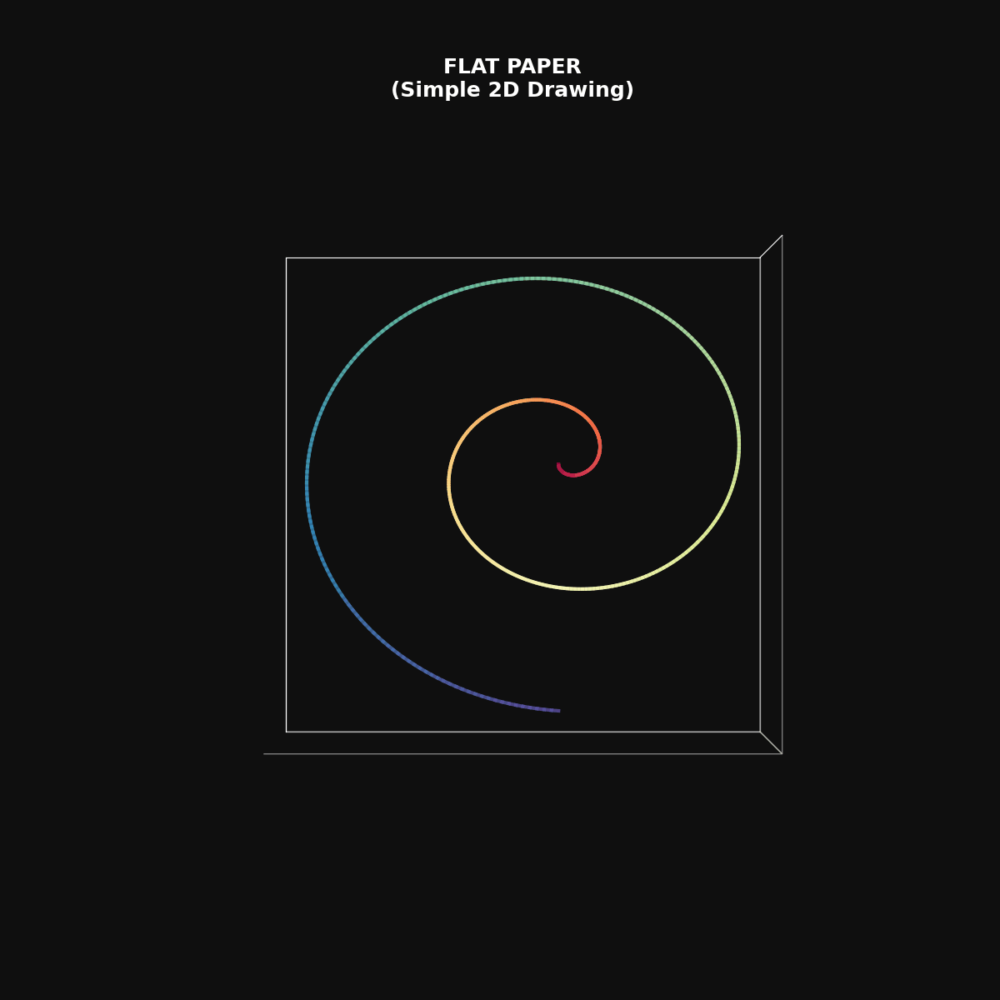


🎬 Generating GIF 3: Neural Network as Geometric Transformer...
✅ Saved: network_layers_uncrumpling.gif


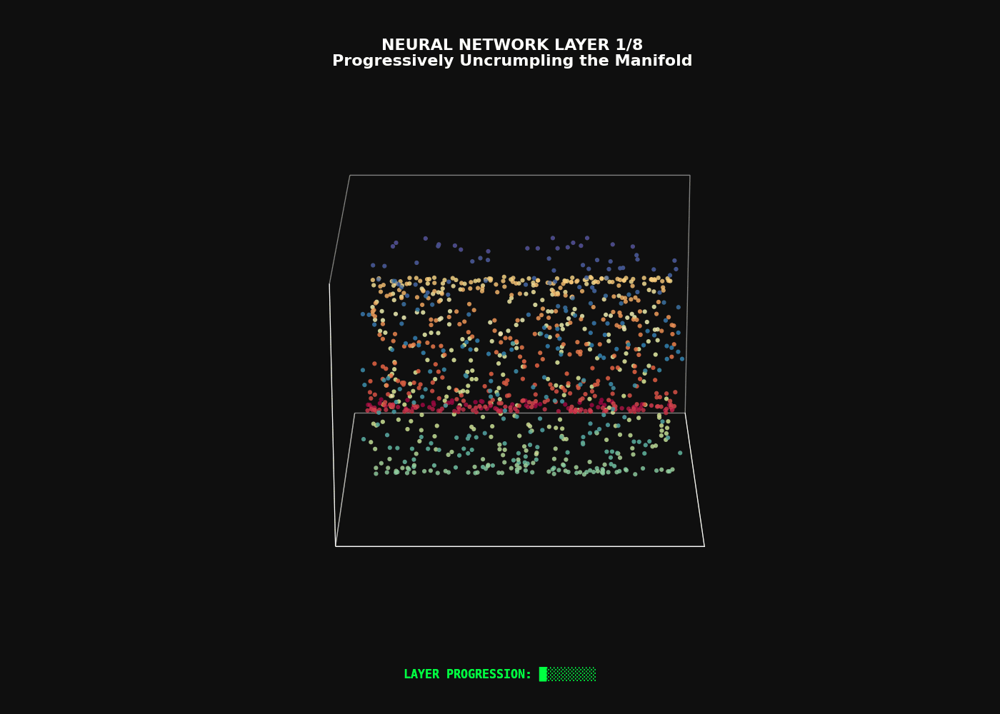


✅ ALL GIFS GENERATED SUCCESSFULLY!

📁 Files created:
  1. manifold_uncrumpling.gif
  2. paper_ball_analogy.gif
  3. network_layers_uncrumpling.gif

💡 Use these in your Medium article to visualize:
  • GIF 1: The core concept (3D → 2D transformation)
  • GIF 2: The paper ball metaphor
  • GIF 3: How neural networks work layer by layer

🚀 Ready to go viral!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
"""



Author: Swarnendu Bhattacharya
GitHub: https://github.com/MLDreamer
"""

# Install required packages
!pip install matplotlib numpy scikit-learn pillow

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import Isomap
from sklearn.datasets import make_swiss_roll
from IPython.display import Image, display
import warnings
warnings.filterwarnings('ignore')

# Set style
plt.style.use('dark_background')

#############################################
# GIF 1: THE UNCRUMPLING (Side-by-Side)
#############################################

def generate_gif_1_uncrumpling():
    """
    The Money Shot: 3D Swiss Roll → 2D Flat Surface
    Left: Rotating 3D manifold
    Right: Progressive uncrumpling to flat 2D
    """
    print("🎬 Generating GIF 1: The Uncrumpling...")

    # Generate Swiss Roll data
    n_samples = 1500
    X, color = make_swiss_roll(n_samples, noise=0.1, random_state=42)

    # Create figure with dark background
    fig = plt.figure(figsize=(16, 7), facecolor='#0f0f0f')

    # 3D plot (left)
    ax1 = fig.add_subplot(121, projection='3d', facecolor='#0f0f0f')
    ax1.set_title('CRUMPLED REALITY\n(High-Dimensional Space)',
                  fontsize=16, color='white', pad=20, weight='bold')

    # 2D plot (right)
    ax2 = fig.add_subplot(122, facecolor='#0f0f0f')
    ax2.set_title('UNCRUMPLED REALITY\n(Latent Space)',
                  fontsize=16, color='white', pad=20, weight='bold')

    # Remove axes for clean look
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax1.set_zticks([])
    ax1.xaxis.pane.fill = False
    ax1.yaxis.pane.fill = False
    ax1.zaxis.pane.fill = False
    ax1.grid(False)

    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    ax2.spines['left'].set_visible(False)

    # Precompute Isomap transformations for different stages
    n_frames = 60
    transformations = []

    for i in range(n_frames):
        # Gradually increase n_neighbors to show progressive uncrumpling
        n_neighbors = int(5 + (50 - 5) * (i / n_frames))
        isomap = Isomap(n_neighbors=n_neighbors, n_components=2)
        X_transformed = isomap.fit_transform(X)
        transformations.append(X_transformed)

    def update(frame):
        ax1.clear()
        ax2.clear()

        # Reset titles and styling
        ax1.set_title('CRUMPLED REALITY\n(High-Dimensional Space)',
                      fontsize=16, color='white', pad=20, weight='bold')
        ax2.set_title('UNCRUMPLED REALITY\n(Latent Space)',
                      fontsize=16, color='white', pad=20, weight='bold')

        # 3D Swiss Roll (rotating)
        angle = frame * 3
        ax1.view_init(elev=10, azim=angle)
        scatter1 = ax1.scatter(X[:, 0], X[:, 1], X[:, 2],
                              c=color, cmap='Spectral',
                              s=20, alpha=0.8, edgecolors='none')

        # Remove axes
        ax1.set_xticks([])
        ax1.set_yticks([])
        ax1.set_zticks([])
        ax1.xaxis.pane.fill = False
        ax1.yaxis.pane.fill = False
        ax1.zaxis.pane.fill = False
        ax1.grid(False)

        # 2D Uncrumpling (progressive)
        X_2d = transformations[frame]
        scatter2 = ax2.scatter(X_2d[:, 0], X_2d[:, 1],
                              c=color, cmap='Spectral',
                              s=20, alpha=0.8, edgecolors='none')

        ax2.set_aspect('equal')
        ax2.set_xticks([])
        ax2.set_yticks([])
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
        ax2.spines['bottom'].set_visible(False)
        ax2.spines['left'].set_visible(False)

        # Add progress indicator
        progress = frame / n_frames
        fig.text(0.5, 0.02, f'UNCRUMPLING PROGRESS: {int(progress*100)}%',
                ha='center', fontsize=14, color='#00ff41', weight='bold')

    anim = FuncAnimation(fig, update, frames=n_frames, interval=100, repeat=True)

    # Save
    writer = PillowWriter(fps=10)
    filename = 'manifold_uncrumpling.gif'
    anim.save(filename, writer=writer, dpi=100)
    plt.close()

    print(f"✅ Saved: {filename}")
    display(Image(filename))
    return filename


#############################################
# GIF 2: THE PAPER BALL ANALOGY
#############################################

def generate_gif_2_paper_ball():
    """
    The Metaphor: Simple 2D line gets crumpled into 3D chaos
    Shows: Flat → Crumpled → Flat again
    """
    print("🎬 Generating GIF 2: The Paper Ball Analogy...")

    # Create a simple spiral on 2D paper
    t = np.linspace(0, 4*np.pi, 500)
    x_flat = t * np.cos(t)
    y_flat = t * np.sin(t)

    fig = plt.figure(figsize=(12, 12), facecolor='#0f0f0f')
    ax = fig.add_subplot(111, projection='3d', facecolor='#0f0f0f')

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.grid(False)

    n_frames = 80

    def update(frame):
        ax.clear()

        if frame < 30:
            # Phase 1: Flat paper (2D)
            z = np.zeros_like(x_flat)
            title = 'FLAT PAPER\n(Simple 2D Drawing)'
            ax.view_init(elev=90, azim=0)  # Top-down view
        elif frame < 60:
            # Phase 2: Crumpling (add 3D distortion)
            crumple_progress = (frame - 30) / 30
            z = np.sin(t * 3) * crumple_progress * 2
            x = x_flat + np.cos(t * 5) * crumple_progress
            y = y_flat + np.sin(t * 4) * crumple_progress
            x_flat_temp = x
            y_flat_temp = y
            title = 'CRUMPLING...\n(Creating Chaos)'
            ax.view_init(elev=20, azim=frame*3)
        else:
            # Phase 3: Uncrumpling back to flat
            uncrumple_progress = 1 - ((frame - 60) / 20)
            z = np.sin(t * 3) * uncrumple_progress * 2
            x = x_flat
            y = y_flat
            title = 'UNCRUMPLING\n(Revealing Simplicity)'
            ax.view_init(elev=90 - 70*uncrumple_progress, azim=frame*3)

        # Plot the line
        colors = plt.cm.Spectral(np.linspace(0, 1, len(t)))

        if frame < 30:
            for i in range(len(t)-1):
                ax.plot([x_flat[i], x_flat[i+1]],
                       [y_flat[i], y_flat[i+1]],
                       [z[i], z[i+1]],
                       color=colors[i], linewidth=3, alpha=0.8)
        elif frame < 60:
            for i in range(len(t)-1):
                ax.plot([x_flat_temp[i], x_flat_temp[i+1]],
                       [y_flat_temp[i], y_flat_temp[i+1]],
                       [z[i], z[i+1]],
                       color=colors[i], linewidth=3, alpha=0.8)
        else:
            for i in range(len(t)-1):
                ax.plot([x[i], x[i+1]],
                       [y[i], y[i+1]],
                       [z[i], z[i+1]],
                       color=colors[i], linewidth=3, alpha=0.8)

        ax.set_title(title, fontsize=18, color='white', pad=20, weight='bold')

        # Remove axes
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.grid(False)

    anim = FuncAnimation(fig, update, frames=n_frames, interval=100, repeat=True)

    writer = PillowWriter(fps=10)
    filename = 'paper_ball_analogy.gif'
    anim.save(filename, writer=writer, dpi=100)
    plt.close()

    print(f"✅ Saved: {filename}")
    display(Image(filename))
    return filename


#############################################
# GIF 3: NEURAL NETWORK LAYERS AS UNCRUMPLING
#############################################

def generate_gif_3_network_layers():
    """
    The Mechanism: Show how each layer of a neural network
    progressively flattens the manifold
    """
    print("🎬 Generating GIF 3: Neural Network as Geometric Transformer...")

    # Generate data
    n_samples = 1000
    X, color = make_swiss_roll(n_samples, noise=0.1, random_state=42)

    # Simulate progressive transformations (like neural network layers)
    n_layers = 8
    transformations = []

    # Start with 3D
    transformations.append(X)

    # Gradually reduce dimensionality and untangle
    for layer in range(1, n_layers):
        n_neighbors = 5 + layer * 8
        isomap = Isomap(n_neighbors=n_neighbors, n_components=2)
        X_2d = isomap.fit_transform(X)

        # Add back a diminishing 3rd dimension for visualization
        z_scale = 1 - (layer / n_layers)
        X_3d_viz = np.column_stack([X_2d[:, 0], X_2d[:, 1],
                                     np.sin(X_2d[:, 0] * 0.1) * z_scale * 5])
        transformations.append(X_3d_viz)

    # Create animation
    fig = plt.figure(figsize=(14, 10), facecolor='#0f0f0f')
    ax = fig.add_subplot(111, projection='3d', facecolor='#0f0f0f')

    n_frames = 80
    frames_per_layer = n_frames // n_layers

    def update(frame):
        ax.clear()

        # Determine which layer we're on
        current_layer = min(frame // frames_per_layer, n_layers - 1)
        next_layer = min(current_layer + 1, n_layers - 1)

        # Interpolate between layers
        t = (frame % frames_per_layer) / frames_per_layer
        X_current = transformations[current_layer]
        X_next = transformations[next_layer]
        X_display = X_current * (1 - t) + X_next * t

        # Plot
        scatter = ax.scatter(X_display[:, 0], X_display[:, 1], X_display[:, 2],
                           c=color, cmap='Spectral', s=20, alpha=0.8,
                           edgecolors='none')

        # Rotate view
        ax.view_init(elev=20, azim=frame * 2)

        # Title
        ax.set_title(f'NEURAL NETWORK LAYER {current_layer + 1}/{n_layers}\n' +
                    'Progressively Uncrumpling the Manifold',
                    fontsize=16, color='white', pad=20, weight='bold')

        # Remove axes
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.grid(False)

        # Progress bar
        fig.text(0.5, 0.05,
                f'LAYER PROGRESSION: {"█" * (current_layer + 1)}{"░" * (n_layers - current_layer - 1)}',
                ha='center', fontsize=12, color='#00ff41', weight='bold',
                family='monospace')

    anim = FuncAnimation(fig, update, frames=n_frames, interval=100, repeat=True)

    writer = PillowWriter(fps=10)
    filename = 'network_layers_uncrumpling.gif'
    anim.save(filename, writer=writer, dpi=100)
    plt.close()

    print(f"✅ Saved: {filename}")
    display(Image(filename))
    return filename


#############################################
# MAIN EXECUTION
#############################################

if __name__ == "__main__":
    print("=" * 60)
    print("MANIFOLD HYPOTHESIS VISUALIZATION GENERATOR")
    print("Creating 3 viral GIFs for your article...")
    print("=" * 60)
    print()

    # Generate all three GIFs
    gif1 = generate_gif_1_uncrumpling()
    print()
    gif2 = generate_gif_2_paper_ball()
    print()
    gif3 = generate_gif_3_network_layers()

    print()
    print("=" * 60)
    print("✅ ALL GIFS GENERATED SUCCESSFULLY!")
    print("=" * 60)
    print()
    print("📁 Files created:")
    print("  1. manifold_uncrumpling.gif")
    print("  2. paper_ball_analogy.gif")
    print("  3. network_layers_uncrumpling.gif")
    print()
    print("💡 Use these in your Medium article to visualize:")
    print("  • GIF 1: The core concept (3D → 2D transformation)")
    print("  • GIF 2: The paper ball metaphor")
    print("  • GIF 3: How neural networks work layer by layer")
    print()

    print("=" * 60)

    # In Colab, files will be available in the Files panel for download
    from google.colab import files
    files.download('manifold_uncrumpling.gif')
    files.download('paper_ball_analogy.gif')
    files.download('network_layers_uncrumpling.gif')